# Calibration and coaddition for M3 and M67

### _Note: M3 was done by Chun-Hao_
_observation date: 04/13/17_

In [149]:
%%capture
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("/afs/ir.stanford.edu/class/physics100/workdir/g2/Jason/codes/")
import pyfits
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.colors import LogNorm
import os
from caliprocess import *
%matplotlib inline

plt.rcParams['axes.titlesize'] = 60
plt.rcParams['axes.labelsize'] = 40
plt.rcParams['xtick.labelsize'] = 40
plt.rcParams['ytick.labelsize'] = 40

In [4]:
from IPython.core.display import Image, display

---
## M67

In [144]:
datadir = '/afs/ir.stanford.edu/class/physics100/workdir/g2/M67/2017-04-13/'
predir  = '/afs/ir.stanford.edu/class/physics100/workdir/g2'

In [93]:
M67_R_list = np.asarray(pd.read_csv(datadir+'R/fitsfiles.list',header=None))[:,0]
M67_G_list = np.asarray(pd.read_csv(datadir+'G/fitsfiles.list',header=None))[:,0]
M67_B_list = np.asarray(pd.read_csv(datadir+'B/fitsfiles.list',header=None))[:,0]
M67_Cali_list = np.asarray(pd.read_csv(datadir+'Cali/fitsfiles.list',header=None))[:,0]

check that everything is as expected...

In [39]:
#M67_R_list

#### I wrote a class to wrap up all the calibration process

In [150]:
M67_go = CaliProcess(datadir=datadir,basename='M67')

In [151]:
%%capture
M67_go.makeCali(M67_Cali_list,'med')

### Display the calibration files

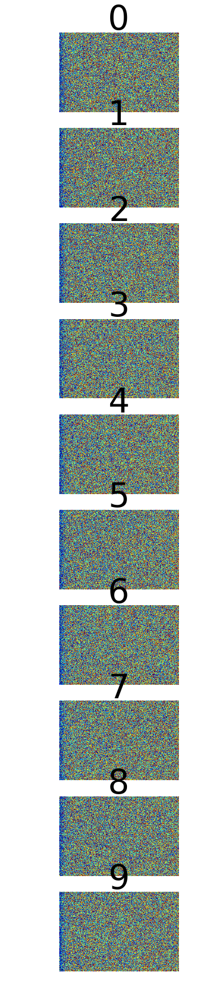

In [101]:
M67_go.dispCali(which='bias',low=2090,high=2125)

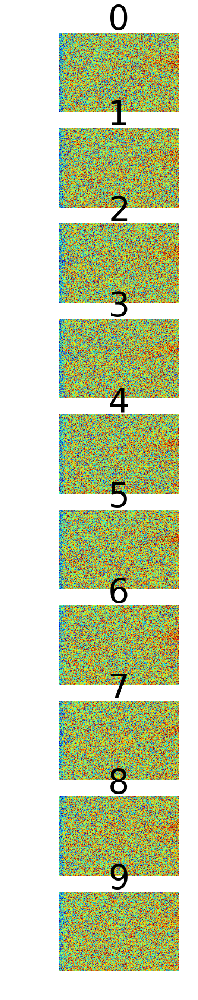

In [133]:
M67_go.dispCali(which='dark',low=2080,high=2135)

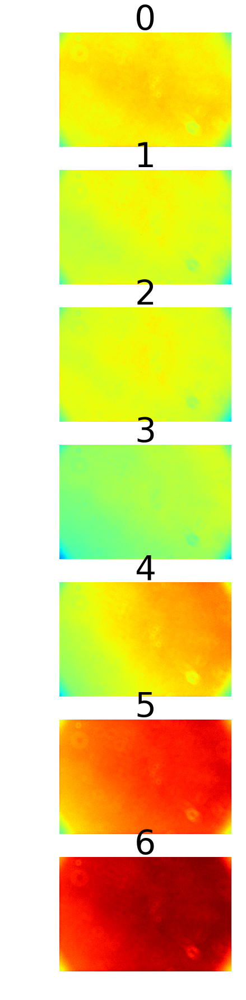

In [140]:
M67_go.dispCali(which='flat_R',low=25000,high=50000)

OKay, the flats ranged quite large. For simplicity, I'll use all of them
## Calibration

In [152]:
%%capture
M67_go.runCali(M67_R_list,M67_G_list,M67_B_list)

## Coaddition
See `chto_coadd` for strategy for dealing with multiple files.

Will use 'R' to determine reference catalog
I have found 10 images to align.
Your workdir already exists. 
(workdir = /afs/ir.stanford.edu/class/physics100/workdir/g2/M67/2017-04-13/R/coadd/)
Should I delete it?y
Ok, starting from scratch.
Database written. See you !
Reading database...
I will now start to run sextractor on these 10 images.
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
1 / 10 : Processed_M67_u3-011R.fit
Processed_M67_u3-011R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
2 / 10 : Processed_M67_u3-012R.fit
Processed_M67_u3-012R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
3 / 10 : Processed_M67_u3-013R.fit
Processed_M67_u3-013R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
4 / 10 : Processed_M67_u3-014R.fit
Processed_M67_u3-014R.cat
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
5 / 10 :

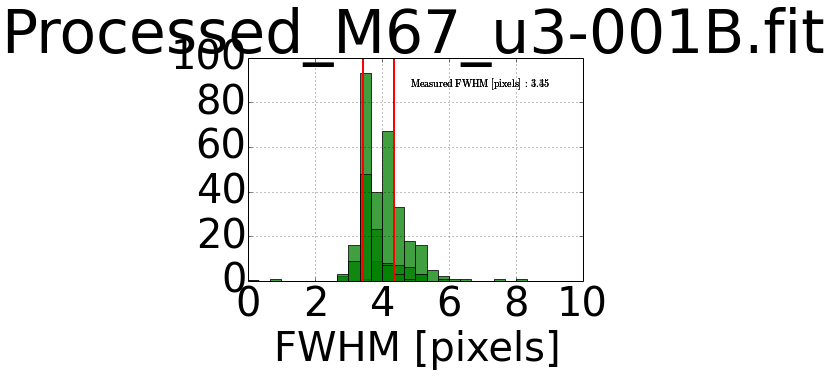

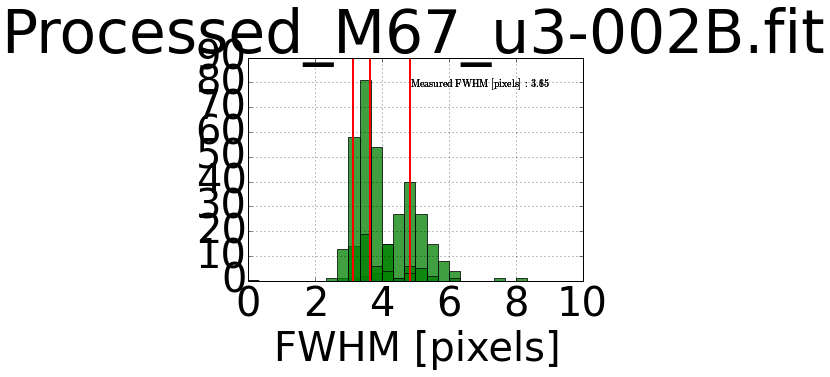

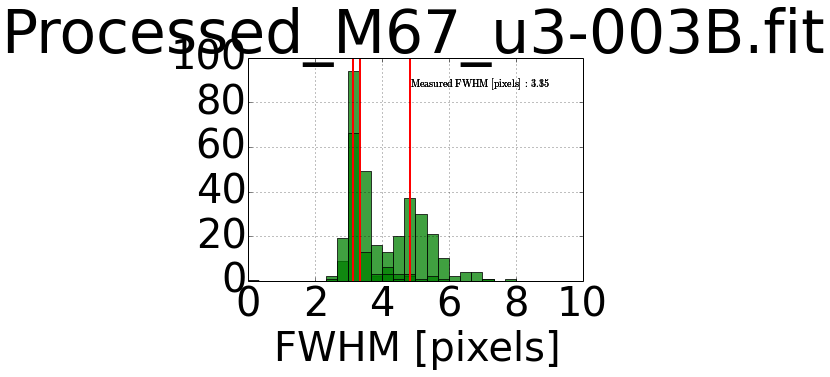

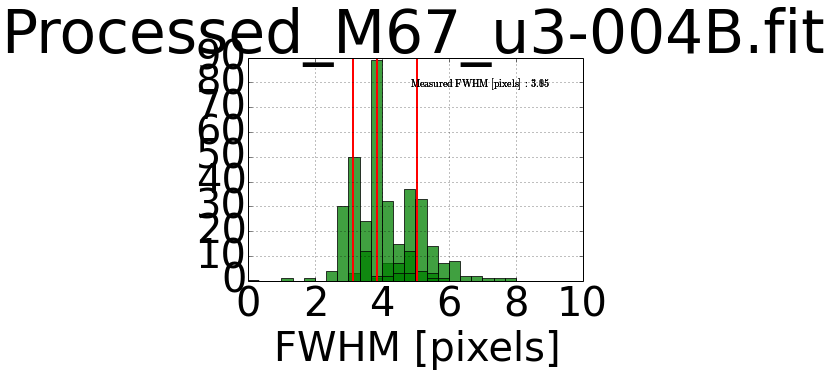

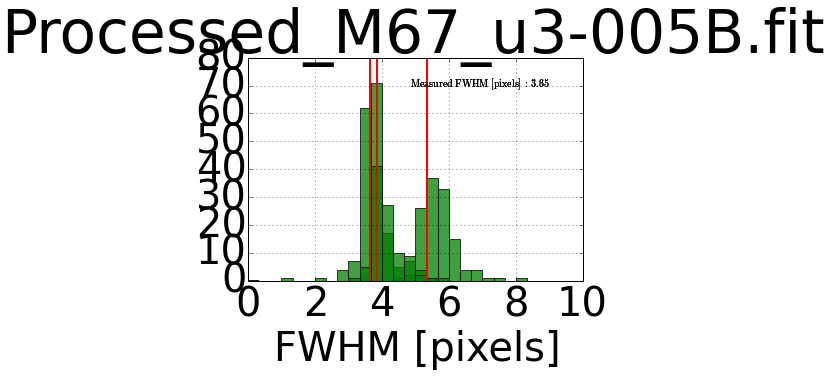

...

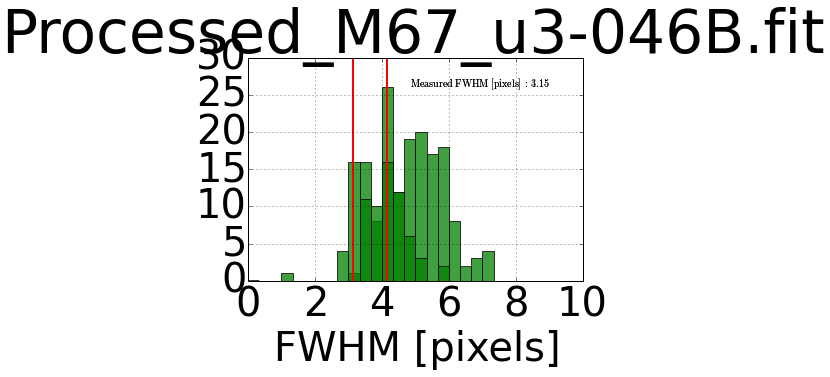

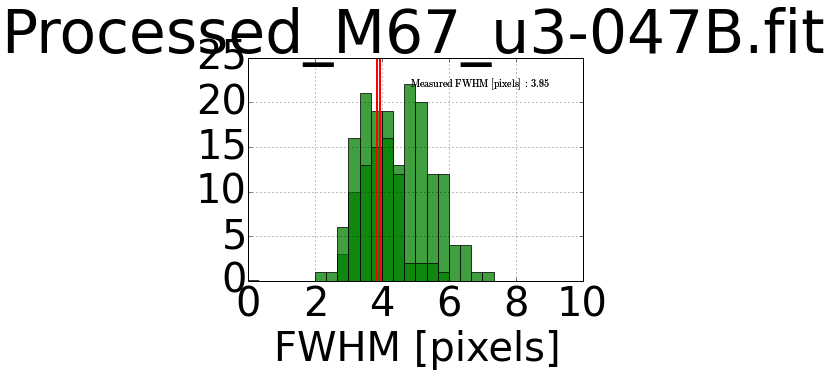

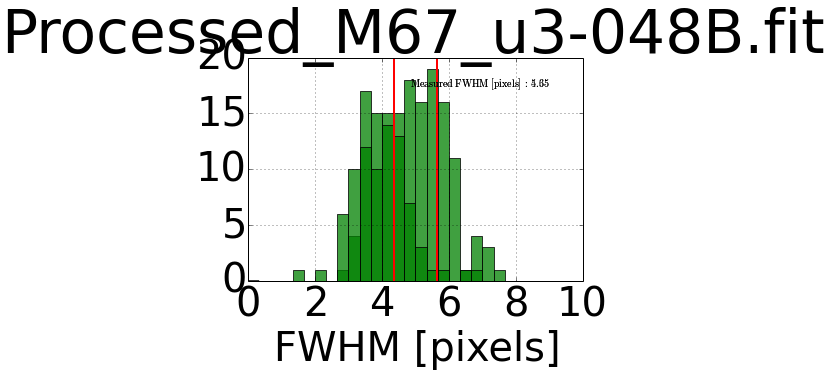

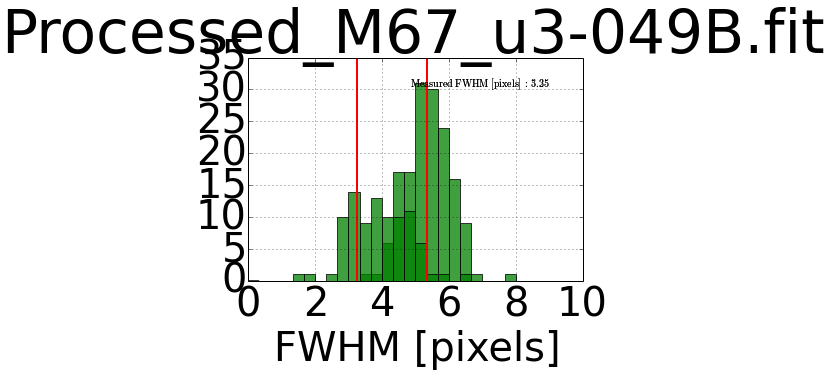

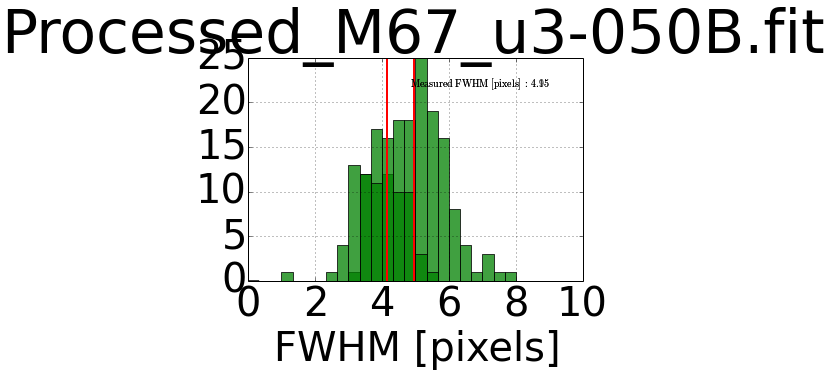

In [153]:
M67_go.coaddWhole()

### Before v.s. after

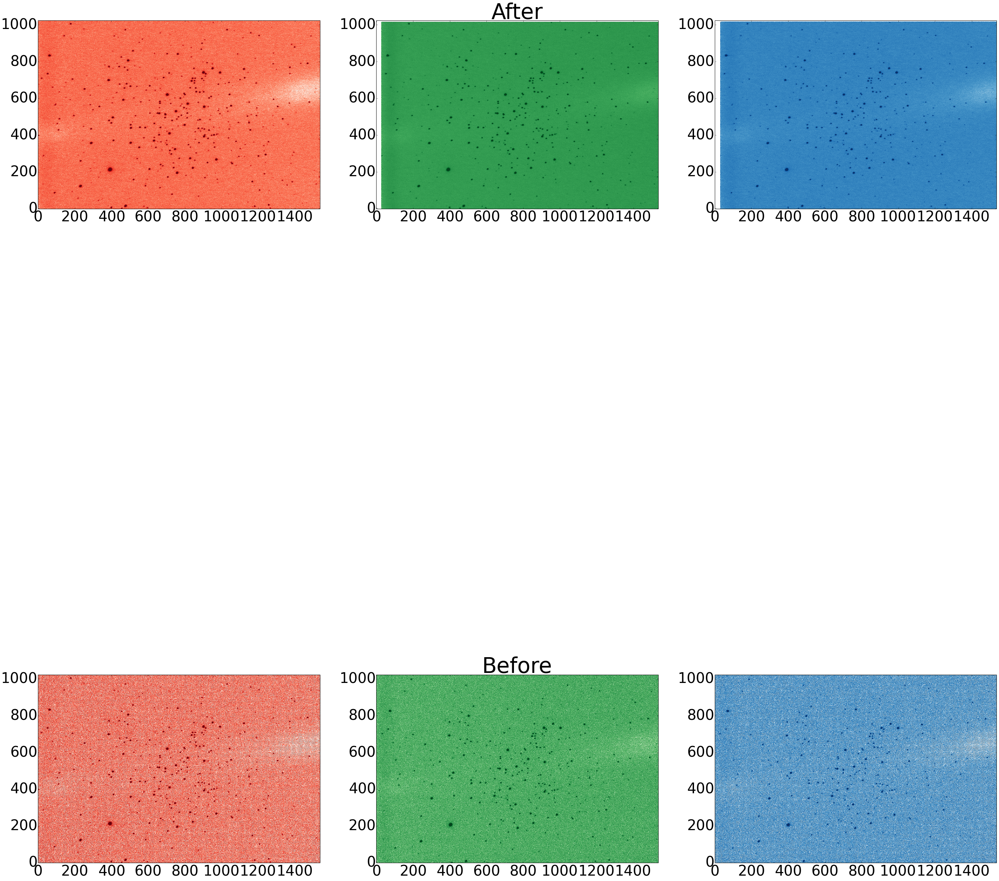

In [157]:
Rlim = (7e0,1e2)
Glim = (1e1,1.5e2)
Blim = (3e0,1e2)
M67_go.dispCoadd(Rlim,Glim,Blim)